In [1]:
import sys
import os
import platform
import importlib
import glob
import calendar
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import cartopy
import cartopy.crs as ccrs
import warnings

import numpy as np
import pandas as pd
import netCDF4
from tqdm import tqdm
import json
import joblib
import re
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score
from bayes_opt import BayesianOptimization
import multiprocessing as mp

import cupy as cp # Cupy is used to handle data on GPU
import xgboost as xgb
from cuml.linear_model import ElasticNet as cuML_ElasticNet
import cuml
from cuml.ensemble import RandomForestRegressor as cuRF
from cuml.svm import SVR
import lightgbm as lgb
import torch
import tensorflow as tf
import keras
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Input, Dense, Dropout, BatchNormalization
from keras.callbacks import EarlyStopping, ReduceLROnPlateau #, LearningRateScheduler

base_FP = '/home/subin/data'
cpuserver_data_FP = '/home/subin/cpuserver_data'
print(base_FP)
print(cpuserver_data_FP)
sys.path.append(base_FP + '/python_modules')

import HydroAI.Data as hData
import HydroAI.ERA5_land as hERA5
import HydroAI.SMAP as hSMAP
import HydroAI.Grid as hGrid
import HydroAI.TC_like as hTCL
import develop_HydroAI.HydroAI.Plot as hPlot
import develop_HydroAI.HydroAI.Shallow_ML as hSML
import HydroAI.Land_Properties as hLP
import develop_HydroAI.HydroAI.HLS as hHLS

importlib.reload(hData);
importlib.reload(hERA5);
importlib.reload(hGrid);
importlib.reload(hSMAP);
importlib.reload(hTCL);
importlib.reload(hPlot);
importlib.reload(hSML);
importlib.reload(hLP);
importlib.reload(hHLS);

/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-09-22 08:03:10.968065: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-09-22 08:03:11.001851: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-22 08:03:11.001879: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-22 08

/home/subin/data
/home/subin/cpuserver_data


### Load dataset

In [2]:
insitu_dict = {
    316:(35.1144, 126.9974), # MDS  
    689:(35.1008, 126.8985), # GJNG 
    708:(35.1289, 126.7452), # GS   
    722:(35.1368, 126.9288), # JSD  
    783:(35.2303, 126.8408), # GGW  
    788:(35.1316, 126.8813)  # PA   
}

# (lat min, lat max, lon min, lon max)
insitu_df_year_dict ={
    316:(35.11425, 35.11455, 126.99735, 126.99765),
    689:(35.10075, 35.10105, 126.89835, 126.89865),
    708:(35.12895, 35.12925, 126.74505, 126.74535),
    722:(35.13675, 35.13705, 126.92865, 126.92895),
    783:(35.23005, 35.23035, 126.84075, 126.84105),
    788:(35.13135, 35.13165, 126.88125, 126.88155)
}

In [3]:
df_insitu = pd.read_csv('in_situ/Dataset_in_situ_2014_2023.csv')
# Convert df_insitu's date column from object (string) to datetime first
df_insitu['date'] = pd.to_datetime(df_insitu['date'], format='%Y-%m-%d')
# Then convert it to the int64 format (YYYYMMDD)
df_insitu['date'] = df_insitu['date'].dt.strftime('%Y%m%d').astype(int)
print(np.shape(df_insitu))
df_insitu.head()

(20105, 12)


,location,date,ave_temperature,min_temperature,min_temperature_time,max_temperature,max_temperature_time,precipitation,max_wind_speed,max_wind_speed_time,ave_wind_speed,max_wind_speed_direction
0,316,20140101,-2.3,-5.0,508.0,1.3,1518.0,0.0,16.7,1353.0,9.5,302.1
1,316,20140102,-1.4,-3.8,247.0,1.6,1506.0,0.0,16.0,509.0,5.0,44.4
2,316,20140103,0.3,-2.3,0.0,5.1,1231.0,0.0,10.3,2202.0,4.4,29.9
3,316,20140104,-4.0,-6.6,654.0,0.2,1512.0,0.0,10.8,58.0,3.4,30.8
4,316,20140105,-3.9,-5.9,3.0,-0.7,1517.0,0.0,14.7,2357.0,5.4,49.0


In [4]:
df_insitu_2013 = pd.read_csv('in_situ/Dataset_in_situ_2013.csv')
# Convert df_insitu's date column from object (string) to datetime first
df_insitu_2013['date'] = pd.to_datetime(df_insitu_2013['date'], format='%Y-%m-%d')
# Then convert it to the int64 format (YYYYMMDD)
df_insitu_2013['date'] = df_insitu_2013['date'].dt.strftime('%Y%m%d').astype(int)
print(np.shape(df_insitu_2013))
df_insitu_2013.head()

(1823, 4)


,location,date,ave_temperature,max_temperature
0,316,20130101,-3.9,-2.3
1,316,20130102,-9.2,-2.7
2,316,20130103,-13.0,-11.4
3,316,20130104,-7.8,-4.4
4,316,20130105,-7.0,-3.5


In [5]:
df_insitu_2024 = pd.read_csv('in_situ/Dataset_in_situ_2024.csv')
# Convert df_insitu's date column from object (string) to datetime first
df_insitu_2024['date'] = pd.to_datetime(df_insitu_2024['date'], format='%Y-%m-%d')
# Then convert it to the int64 format (YYYYMMDD)
df_insitu_2024['date'] = df_insitu_2024['date'].dt.strftime('%Y%m%d').astype(int)
print(np.shape(df_insitu_2024))
df_insitu_2024.head()

(1570, 4)


,location,date,ave_temperature,max_temperature
0,316,20240101,-0.8,3.5
1,316,20240102,-0.7,1.7
2,316,20240103,-2.6,-1.2
3,316,20240104,-1.7,2.5
4,316,20240105,1.7,4.6


In [6]:
'''
print(np.unique(df_year[(df_year['latitude'].values < 35.1316 + 0.0005) & \
                        (df_year['latitude'].values > 35.1316 - 0.0005)]['latitude'].values))

print(np.unique(df_year[(df_year['longitude'].values < 126.8813 + 0.0005) & \
                        (df_year['longitude'].values > 126.8813 - 0.0005)]['longitude'].values))
print(len(df_year[(df_year['latitude'].values == 35.11455) & (df_year['longitude'].values == 126.99735)]))
'''

"\nprint(np.unique(df_year[(df_year['latitude'].values < 35.1316 + 0.0005) &                         (df_year['latitude'].values > 35.1316 - 0.0005)]['latitude'].values))\n\nprint(np.unique(df_year[(df_year['longitude'].values < 126.8813 + 0.0005) &                         (df_year['longitude'].values > 126.8813 - 0.0005)]['longitude'].values))\nprint(len(df_year[(df_year['latitude'].values == 35.11455) & (df_year['longitude'].values == 126.99735)]))\n"

In [7]:
save_path = f'{cpuserver_data_FP}/HLS/Korea/UHI_project_L30/2013_2024'
if not os.path.exists(save_path):
    os.makedirs(save_path)

for year_idx, year in enumerate(range(2013, 2024 + 1)):
    df_year = pd.read_csv(f'{cpuserver_data_FP}/HLS/Korea/UHI_project_L30/HLS_{year}_GJ.csv')
    # Cloud masking
    df_year['cloud'] = hHLS.is_cloud(df_year['qa'].values)
    df_year = df_year[(df_year.cloud == 0)]
    
    # Extract insitu yearly
    if year == 2013:
        df_insitu_year = df_insitu_2013[df_insitu_2013['date'].isin(df_year['dates'])]
    elif year == 2024:
        df_insitu_year = df_insitu_2024[df_insitu_2024['date'].isin(df_year['dates'])]
    else:
        df_insitu_year = df_insitu[df_insitu['date'].isin(df_year['dates'])]
    
    pixels_idx = []
    for key, value in insitu_dict.items():
        df_year_lon_lat = insitu_df_year_dict[key]
        pixel1 = df_year[(df_year['latitude'].values == df_year_lon_lat[0]) & \
                         (df_year['longitude'].values == df_year_lon_lat[2])]
        pixel2 = df_year[(df_year['latitude'].values == df_year_lon_lat[1]) & \
                         (df_year['longitude'].values == df_year_lon_lat[2])]
        pixel3 = df_year[(df_year['latitude'].values == df_year_lon_lat[0]) & \
                         (df_year['longitude'].values == df_year_lon_lat[3])]
        pixel4 = df_year[(df_year['latitude'].values == df_year_lon_lat[1]) & \
                         (df_year['longitude'].values == df_year_lon_lat[3])]

        pixels_idx += list(pixel1.index)
        pixels_idx += list(pixel2.index)
        pixels_idx += list(pixel3.index)
        pixels_idx += list(pixel4.index)
        
        df_insitu_key = df_insitu_year[df_insitu_year['location']==key]

        # Merge & drop
        df_merged_pixel1 = pd.merge(pixel1, df_insitu_key[['date', 'ave_temperature', 'max_temperature']], left_on='dates', right_on='date', how='left')
        df_merged_pixel2 = pd.merge(pixel2, df_insitu_key[['date', 'ave_temperature', 'max_temperature']], left_on='dates', right_on='date', how='left')
        df_merged_pixel3 = pd.merge(pixel3, df_insitu_key[['date', 'ave_temperature', 'max_temperature']], left_on='dates', right_on='date', how='left')
        df_merged_pixel4 = pd.merge(pixel4, df_insitu_key[['date', 'ave_temperature', 'max_temperature']], left_on='dates', right_on='date', how='left')

        df_pixel_all = pd.concat([df_merged_pixel1, df_merged_pixel2, df_merged_pixel3, df_merged_pixel4], ignore_index=True)
        df_pixel_all = df_pixel_all.dropna(axis=0)
        df_pixel_all = df_pixel_all.drop(columns=['Unnamed: 0', 'date', 'cloud'])

        if key != 316:
            df_pixel_all = pd.concat([df_pixel_all_old, df_pixel_all], ignore_index=True)

        df_pixel_all_old = df_pixel_all

    need_to_recons_idx = list(df_year.index)
    need_to_recons_idx = list(set(need_to_recons_idx) - set(pixels_idx))
    need_to_recons = df_year.loc[need_to_recons_idx]
    need_to_recons = need_to_recons.dropna(axis=0)
    need_to_recons = need_to_recons.drop(columns=['Unnamed: 0', 'cloud'])
    need_to_recons.to_csv(f'{save_path}/need_to_recons_{year}.csv', sep=',')
        
    df_year = df_pixel_all

    del df_pixel_all_old; del df_pixel_all; del need_to_recons
    
    if year_idx != 0:
        df_year = pd.concat([df_year_old, df_year], ignore_index=True)
    df_year_old = df_year
    print(year, np.shape(df_year))

del df_year_old
df_year

2013 (447, 16)
2014 (1029, 16)
2015 (1671, 16)
2016 (2241, 16)
2017 (2839, 16)
2018 (3521, 16)
2019 (4280, 16)
2020 (4907, 16)
2021 (5697, 16)
2022 (7228, 16)
2023 (8546, 16)
2024 (9614, 16)


,latitude,longitude,dates,coastal,blue,green,red,nir,swir1,swir2,cirrus,tir1,tir2,qa,ave_temperature,max_temperature
0,35.11425,126.99735,20130411,0.00000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,2.0,7.1
1,35.11425,126.99735,20130425,6294.66650,0.645911,0.657956,0.657233,0.6740,0.606067,0.500433,60.22222,0.034900,0.035644,192.0,7.5,11.6
2,35.11425,126.99735,20130427,0.00000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,9.6,15.9
3,35.11425,126.99735,20130511,0.00000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,14.8,20.9
4,35.11425,126.99735,20130513,0.00000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,17.9,23.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9609,35.13165,126.88155,20240823,0.00000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,27.5,33.4
9610,35.13165,126.88155,20240830,499.33334,0.115567,0.141167,0.125211,0.3863,0.247200,0.140100,9.00000,27.476667,24.270000,192.0,27.9,33.6
9611,35.13165,126.88155,20240831,0.00000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,26.4,32.4
9612,35.13165,126.88155,20240908,0.00000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,26.6,32.9


In [8]:
size_in_bytes = sys.getsizeof(df_year)
size_in_gigabytes = size_in_bytes / (1024**3)
print(f"The size of the variable is: {size_in_gigabytes} gigabytes")

# Standard scaling
scaler_X = StandardScaler()
scaler_y = StandardScaler()

The size of the variable is: 0.0011462122201919556 gigabytes


In [9]:
def make_indices_df(df):
    blue  = df['blue'].values
    green = df['green'].values
    red   = df['red'].values
    nir   = df['nir'].values
    swir1 = df['swir1'].values
    swir2 = df['swir2'].values
    tir1  = df['tir1'].values
    tir2  = df['tir2'].values
    
    # Extracted urban indices (ref: Mostofi_Hasanlou_2017_EELM) --> This paper has wrong equation of NDWI & MNDWI
    #NDBaI = (swir1 - tir1) / (swir1 + tir1)
    NDBI  = (swir1 - nir) / (swir1 + nir)
    BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
    UI    = (swir2 - nir) / (swir2 + nir)
    IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
    #EBBI  = (swir1 - nir) / ( 10*np.sqrt(swir1+tir1) )

    # Extracted vegetation indices
    NDVI  = (nir - red) / (nir + red)
    L = 1; C1 = 6; C2 = 7.5; G = 2.5 # constant for EVI
    EVI   = G * (nir - red) / (nir + C1*red - C2*blue + L)
    L = 0.5 # constant for SAVI
    SAVI  = (nir - red) * (L + 1) / (nir + red + L)

    # Water index
    NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
    MNDWI = (green - swir1) / (green + swir1) # wrong in ref paper ((green - nir) / (green + nir))

    # Make df
    df_geo_indices = pd.DataFrame()
    df_geo_indices['latitude'] = df['latitude'].values
    df_geo_indices['longitude'] = df['longitude'].values
    df_geo_indices['dates'] = df['dates'].values

    #df_geo_indices['NDBaI'] = NDBaI
    df_geo_indices['NDBI'] = NDBI
    df_geo_indices['BI'] = BI
    df_geo_indices['UI'] = UI
    df_geo_indices['IBI'] = IBI
    #df_geo_indices['EBBI'] = EBBI
    
    df_geo_indices['NDVI'] = NDVI
    df_geo_indices['EVI']  = EVI
    df_geo_indices['SAVI'] = SAVI
    
    df_geo_indices['NDWI'] = NDWI
    df_geo_indices['MNDWI'] = MNDWI
    
    # Temperatures
    df_geo_indices['tir1'] = tir1
    df_geo_indices['tir2'] = tir2
    
    return df_geo_indices

In [10]:
df_geo_indices = make_indices_df(df_year)

df_geo_indices['ave_temperature'] = df_year['ave_temperature'].values
df_geo_indices['max_temperature'] = df_year['max_temperature'].values

print(np.shape(df_geo_indices))
'''
# Assuming default scaling factors for Landsat 8
M_L = 0.0003342  # Radiance multiplicative scaling factor (from metadata or assumed)
A_L = 0.1        # Radiance additive scaling factor (from metadata or assumed)

# Convert DN to TOA radiance
radiance = M_L * tir1+ A_L

K1 = 774.8853  # Example value for Landsat 8 Band 10 (adjust for your dataset)
K2 = 1321.0789

# Convert radiance to brightness temperature
BT = K2 / np.log((K1 / radiance) + 1)

# Emissivity estimation based on NDVI
emissivity = np.where(NDVI > 0.2, 0.004 * NDVI + 0.986, 0.99)

# LST formula
wavelength = 10.895  # Thermal infrared wavelength (for Landsat 8 Band 10, adjust if necessary)
p = 14380  # Planck constant (mK)

# LST calculation
LST = BT / (1 + (wavelength * BT / p) * np.log(emissivity))

# Convert from Kelvin to Celsius
LST_celsius = LST - 273.15

df_geo_indices['LST'] = LST_celsius

print(np.nanmin(LST_celsius), np.nanmax(LST_celsius))
print(np.nanmin(tir1), np.nanmax(tir1))
'''

df_geo_indices.head()

(9614, 16)


/tmp/ipykernel_2323752/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2323752/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2323752/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2323752/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2323752/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2323752/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

,latitude,longitude,dates,NDBI,BI,UI,IBI,NDVI,EVI,SAVI,NDWI,MNDWI,tir1,tir2,ave_temperature,max_temperature
0,35.11425,126.99735,20130411,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,0.0000,0.000000,2.0,7.1
1,35.11425,126.99735,20130425,-0.05307,-0.021915,-0.147788,1.030509,0.012595,0.054221,0.013734,-0.012046,0.041051,0.0349,0.035644,7.5,11.6
2,35.11425,126.99735,20130427,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,0.0000,0.000000,9.6,15.9
3,35.11425,126.99735,20130511,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,0.0000,0.000000,14.8,20.9
4,35.11425,126.99735,20130513,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,0.0000,0.000000,17.9,23.9


In [11]:
nan_count = df_geo_indices.isna().sum()
print(np.shape(df_geo_indices))
print(nan_count)

# Mask tir1 > 100
#print(np.shape(df_geo_indices[df_geo_indices['tir1'] > 100]))
#df_geo_indices.loc[df_geo_indices['tir1'] > 100, 'tir1'] = np.nan

# Drop nan values
df_geo_indices = df_geo_indices.dropna(axis=0)
print(np.shape(df_geo_indices))

df_geo_indices.to_csv(f'{save_path}/df_geo_indices.csv', sep=',')

df_geo_indices.head()

(9614, 16)
latitude              0
longitude             0
dates                 0
NDBI               6003
BI                 6002
UI                 6003
IBI                6007
NDVI               6003
EVI                   0
SAVI                  0
NDWI               6004
MNDWI              6005
tir1                  0
tir2                  0
ave_temperature       0
max_temperature       0
dtype: int64
(3606, 16)


,latitude,longitude,dates,NDBI,BI,UI,IBI,NDVI,EVI,SAVI,NDWI,MNDWI,tir1,tir2,ave_temperature,max_temperature
1,35.11425,126.99735,20130425,-0.053070,-0.021915,-0.147788,1.030509,0.012595,0.054221,0.013734,-0.012046,0.041051,0.034900,0.035644,7.5,11.6
21,35.11425,126.99735,20131027,-0.036256,0.024254,-0.305251,0.213792,0.598934,0.355370,0.362267,-0.670033,-0.649557,0.129056,0.131233,5.6,11.5
24,35.11425,126.99735,20131112,0.090624,0.151395,-0.123243,0.403764,0.368898,0.210455,0.223450,-0.491794,-0.557568,0.019900,0.023522,-1.8,2.0
32,35.11455,126.99735,20130425,-0.069829,-0.028879,-0.153791,1.079885,-0.000078,-0.000324,-0.000084,0.001554,0.071375,0.034700,0.034978,7.5,11.6
52,35.11455,126.99735,20131027,0.082065,0.135285,-0.194491,0.304477,0.511721,0.286663,0.303531,-0.591246,-0.642153,0.128678,0.131533,5.6,11.5


(361, 16)


<Axes: >

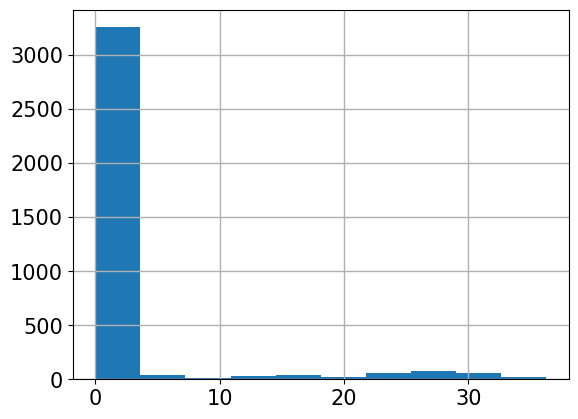

In [12]:
### 2024.09.21. 10PM Code run end
print(np.shape(df_geo_indices[df_geo_indices['tir1'] > 1]))
df_geo_indices['tir1'].hist()

<Axes: >

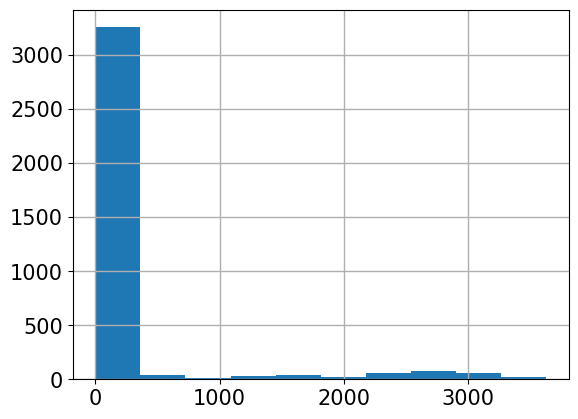

In [13]:
df_geo_indices['tir1'] *= 100
df_geo_indices['tir1'].hist()

(361, 16)


<Axes: >

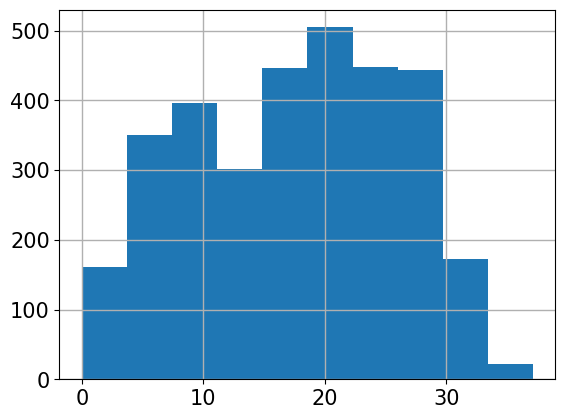

In [14]:
print(np.shape(df_geo_indices[df_geo_indices['tir1'] > 100]))
df_geo_indices.loc[df_geo_indices['tir1'] > 100, 'tir1'] = np.nan
df_geo_indices.loc[df_geo_indices['tir1'] < -100, 'tir1'] = np.nan

df_geo_indices['tir1'].hist()

<Axes: >

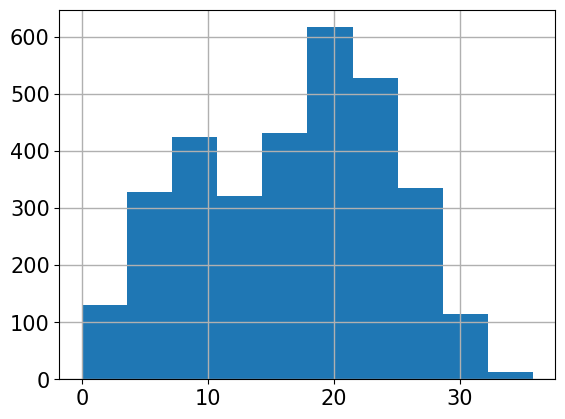

In [15]:
df_geo_indices['tir2'] *= 100

df_geo_indices.loc[df_geo_indices['tir2'] > 100, 'tir2'] = np.nan
df_geo_indices.loc[df_geo_indices['tir2'] < -100, 'tir2'] = np.nan

df_geo_indices['tir2'].hist()

In [16]:
df_geo_indices = df_geo_indices.dropna(axis=0)
print(np.shape(df_geo_indices))

df_geo_indices.to_csv(f'{save_path}/df_geo_indices.csv', sep=',')  # Re-save

(3245, 16)


### Feature importance

In [17]:
seed = 0
y_related_columns = ['dates', 'latitude', 'longitude', 'ave_temperature', 'max_temperature']
X_columns_list = [col for col in df_geo_indices.columns if col not in y_related_columns]
print(X_columns_list)

feature_imp_X = df_geo_indices[X_columns_list].values
feature_imp_y = df_geo_indices['ave_temperature'].values

feature_imp_X = scaler_X.fit_transform(feature_imp_X)
feature_imp_y = scaler_y.fit_transform(feature_imp_y.reshape(-1, 1)).flatten()

feature_imp_X_df = pd.DataFrame(data=feature_imp_X, columns=X_columns_list)

feature_imp = hSML.create_feature_importance_df(feature_imp_X_df, feature_imp_y)
feature_imp.to_csv(f'{save_path}/feature_importance.csv', sep=',', index=False)

# Memory delete
#del feature_imp_X_df
del feature_imp_X
del feature_imp_y

feature_imp.head()

['NDBI', 'BI', 'UI', 'IBI', 'NDVI', 'EVI', 'SAVI', 'NDWI', 'MNDWI', 'tir1', 'tir2']


,feature,importance
0,tir1,0.862224
1,tir2,0.044612
2,UI,0.024559
3,SAVI,0.011484
4,NDBI,0.011470


In [18]:
print(feature_imp)
np.shape(feature_imp_X_df)

   feature  importance
0     tir1    0.862224
1     tir2    0.044612
2       UI    0.024559
3     SAVI    0.011484
4     NDBI    0.011470
5    MNDWI    0.010444
6       BI    0.008988
7     NDVI    0.007419
8      EVI    0.006595
9     NDWI    0.006506
10     IBI    0.005698


(3245, 11)

In [19]:
feature_imp_list = feature_imp['feature'].head(8).values
#feature_imp_list = ['coastal', 'blue', 'green','red', 'nir', 'swir1', 'swir2', 'cirrus', 'tir1', 'tir2']

print(feature_imp_list)
print(np.shape(df_geo_indices))

predictors = df_geo_indices[feature_imp_list].values
outcome = df_geo_indices['ave_temperature'].values

# Standard scaling for predictors & outcome
predictors_scaled = scaler_X.fit_transform(predictors)
outcome_scaled = scaler_y.fit_transform(outcome.reshape(-1, 1)).flatten()
print(np.shape(predictors_scaled), np.shape(outcome_scaled))

X_train, X_test, y_train, y_test = train_test_split(predictors_scaled, outcome_scaled, test_size=0.2, random_state=seed)

['tir1' 'tir2' 'UI' 'SAVI' 'NDBI' 'MNDWI' 'BI' 'NDVI']
(3245, 16)
(3245, 8) (3245,)


### LGBM

|   iter    |  target   | learni... | max_depth | n_esti... | num_le... |
-------------------------------------------------------------------------
| 1         | -0.05933  | 0.1692    | 9.437     | 200.7     | 90.83     |
| 2         | -0.05888  | 0.1329    | 8.813     | 159.4     | 135.9     |
| 3         | -0.05996  | 0.1994    | 8.869     | 157.9     | 136.6     |
| 4         | -0.05975  | 0.2207    | 4.809     | 111.4     | 43.81     |
| 5         | -0.08257  | 0.01014   | 8.534     | 202.4     | 107.1     |
| 6         | -0.05983  | 0.1447    | 8.106     | 198.9     | 77.36     |
| 7         | -0.0604   | 0.2229    | 10.29     | 175.1     | 137.1     |
| 8         | -0.1041   | 0.01      | 4.576     | 164.9     | 121.9     |
| 9         | -0.1033   | 0.01      | 12.0      | 165.5     | 144.9     |
| 10        | -0.0578   | 0.03294   | 8.088     | 196.1     | 84.76     |
| 11        | -0.0592   | 0.1587    | 4.083     | 204.0     | 84.12     |
| 12        | -0.06154  | 0.3       | 

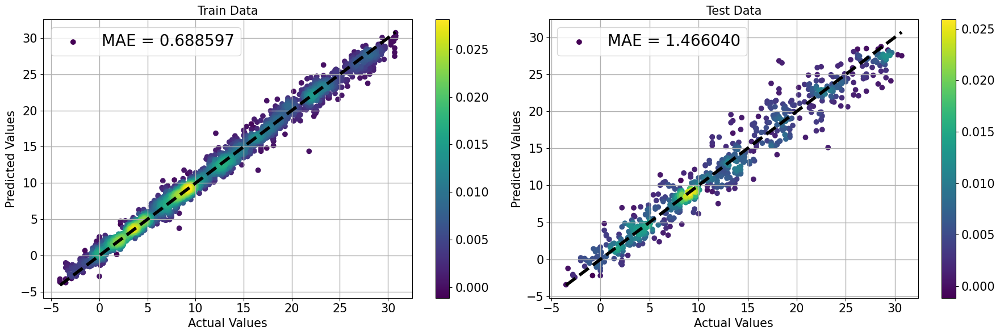

In [20]:
model_name = 'LGBM'

#Light GBM
score, best_params = hSML.Bayesian_optimization_LGBM(X_train, y_train,
                        pbounds = {
                                    'num_leaves': (20, 150),
                                    'max_depth': (3, 12),
                                    'learning_rate': (0.01, 0.3),
                                    'n_estimators': (50, 300)
                                }, n_iter=20)

with open(f'{save_path}/{model_name}_bayesian_best_params.json','w') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)

model = lgb.LGBMRegressor(**best_params)
model.fit(X_train, y_train)

# Save the model
joblib.dump(model, f'{save_path}/{model_name}_model.pkl')

# Evaluate the model
relation_square = model.score(X_train, y_train)
print('Relation coefficient: ', relation_square)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

### RF

|   iter    |  target   | max_depth | max_fe... | min_sa... | n_esti... |
-------------------------------------------------------------------------
| 1         | -0.1205   | 55.33     | 0.743     | 30.93     | 277.0     |
| 2         | -0.1175   | 42.94     | 0.6807    | 23.0      | 447.0     |
| 3         | -0.1175   | 44.17     | 0.7018    | 23.3      | 447.3     |
| 4         | -0.2167   | 1.767     | 0.7665    | 31.49     | 10.45     |
| 5         | -0.1763   | 100.0     | 0.1       | 2.0       | 357.7     |
| 6         | -0.338    | 1.0       | 0.8411    | 50.0      | 500.0     |
| 7         | -0.1104   | 46.0      | 0.999     | 38.44     | 398.1     |
| 8         | -0.6027   | 1.0       | 0.2302    | 27.29     | 334.3     |
| 9         | -0.2126   | 94.09     | 0.1       | 49.42     | 413.0     |
| 10        | -0.107    | 100.0     | 0.999     | 27.39     | 256.6     |
| 11        | -0.1124   | 59.08     | 0.999     | 45.19     | 221.7     |
| 12        | -0.1766   | 97.57     | 

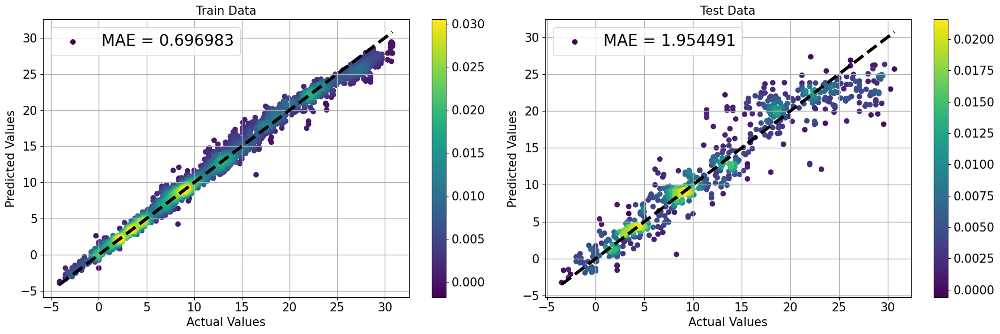

In [21]:
model_name = 'RF'
warnings.filterwarnings("ignore", message="The number of bins", category=UserWarning)
warnings.filterwarnings("ignore", message="To use pickling first train using float32 data to fit the estimator", category=UserWarning)

score, best_params = hSML.Bayesian_optimization_RF(X_train, y_train,
                        pbounds={
                                'n_estimators': (10, 500),
                                'max_features': (0.1, 0.999),
                                'max_depth': (1, 100),
                                'min_samples_split': (2, 50)
                            }, n_iter=20, library_model='RF_cuml')

with open(f'{save_path}/{model_name}_bayesian_best_params.json','w') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)

model = cuRF(**best_params, n_streams=1) # For reproducible (n_streams)
model.fit(X_train, y_train)

# Save the model
joblib.dump(model, f'{save_path}/{model_name}_model.pkl')

relation_square = model.score(X_train, y_train)
print('relation coefficient : ', relation_square)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

### XGB

|   iter    |  target   | colsam... | max_depth | min_ch... | n_esti... |
-------------------------------------------------------------------------


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [08:57:56] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost-split_1722454208151/work/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)


| 1         | -0.07231  | 0.5934    | 71.8      | 30.93     | 277.0     |
| 2         | -0.08642  | 0.4809    | 64.94     | 23.0      | 447.0     |
| 3         | -0.09284  | 0.3172    | 75.43     | 28.05     | 274.5     |
| 4         | -0.06492  | 0.7532    | 20.9      | 13.78     | 99.74     |
| 5         | -0.1341   | 0.1004    | 61.87     | 31.26     | 338.2     |
| 6         | -0.1012   | 0.4967    | 37.47     | 11.95     | 131.6     |
| 7         | -0.0639   | 0.9279    | 93.13     | 25.84     | 349.1     |
| 8         | -0.06548  | 0.8216    | 11.68     | 49.43     | 166.0     |
| 9         | -0.06591  | 0.7826    | 81.78     | 31.4      | 487.4     |
| 10        | -0.07864  | 0.3761    | 6.139     | 27.19     | 204.3     |
| 11        | -0.06377  | 0.9958    | 83.2      | 37.62     | 288.1     |
| 12        | -0.074    | 0.6359    | 30.06     | 4.686     | 177.7     |
| 13        | -0.06266  | 0.9285    | 29.35     | 6.456     | 191.5     |
| 14        | -0.06341  | 0.8048    | 

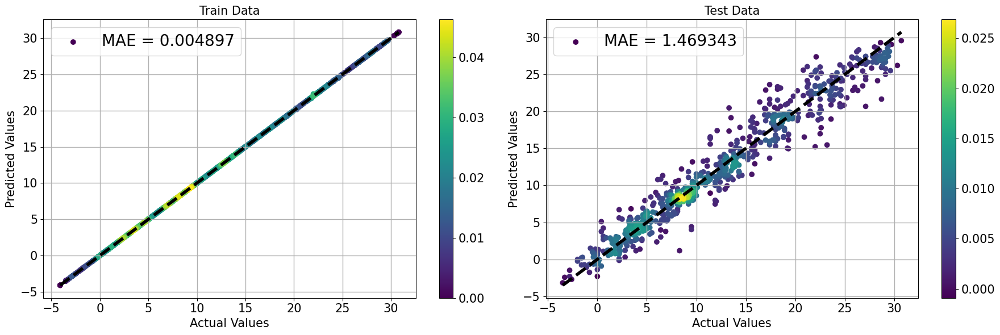

In [22]:
model_name = 'XGB'

# CuPy: CuPy is a GPU array library that is highly compatible with NumPy, making it easy to convert CPU-based NumPy arrays to GPU arrays.
#X_train = cp.array(X_train)
score, best_params = hSML.Bayesian_optimization_XGB(X_train, y_train,
                      pbounds={
                          'n_estimators': (10, 500),
                          'colsample_bytree': (0.1, 0.999),
                          'max_depth': (1, 100),
                          'min_child_weight': (2, 50)
                      }, n_iter=20)

with open(f'{save_path}/{model_name}_bayesian_best_params.json','w') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)

model = xgb.XGBRegressor(**best_params)
model.fit(X_train, y_train)

# Save the model
joblib.dump(model, f'{save_path}/{model_name}_model.pkl')

relation_square = model.score(X_train, y_train)
print('relation coefficient : ', relation_square)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

### SVM

|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
| 1         | -0.117    | 54.93     | 4.146     | 0.6067    | 0.5494    |
| 2         | -0.1024   | 42.42     | 3.938     | 0.4432    | 0.8929    |
| 3         | -0.09799  | 52.21     | 3.573     | 0.534     | 0.4801    |
| 4         | -0.06337  | 72.69     | 2.603     | 0.253     | 0.1913    |
| 5         | -0.07889  | 74.43     | 4.123     | 0.4291    | 0.2409    |
| 6         | -0.06255  | 69.81     | 3.251     | 0.03805   | 0.08937   |
| 7         | -0.3438   | 65.75     | 2.0       | 1.0       | 1.0       |
| 8         | -0.1254   | 78.71     | 2.0       | 0.01      | 1.0       |
| 9         | -0.3438   | 71.44     | 5.0       | 1.0       | 1.0       |
| 10        | -0.06644  | 70.45     | 2.885     | 0.01      | 0.02233   |
| 11        | -0.06757  | 74.47     | 2.145     | 0.01      | 0.01      |
| 12        | -0.1614   | 76.47     | 

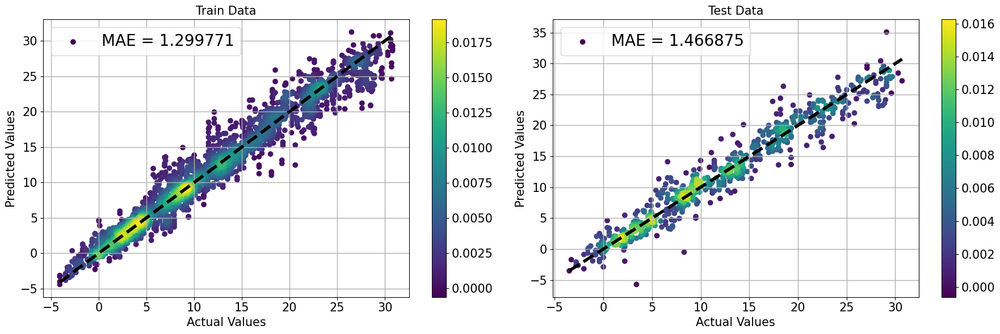

In [23]:
model_name = 'SVM'

score, best_params = hSML.Bayesian_optimization_SVM(X_train, y_train,
                        pbounds = {
                                    'C': (0.1, 100),
                                    'epsilon': (0.01, 1),
                                    'gamma': (0.01, 1),
                                    'degree': (2, 5)  # Only used if kernel is 'poly'
                                }, n_iter=20, library_model='SVM_cuml')

with open(f'{save_path}/{model_name}_bayesian_best_params.json','w') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)

model = SVR(**best_params)
model.fit(X_train, y_train)

# Save the model
joblib.dump(model, f'{save_path}/{model_name}_model.pkl')

relation_square = model.score(X_train, y_train)
print('relation coefficient : ', relation_square)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

|   iter    |  target   |   alpha   | l1_ratio  |
-------------------------------------------------
| 1         | -1.01     | 5.533     | 0.7437    |
| 2         | -1.01     | 6.067     | 0.5904    |
| 3         | -0.1562   | 0.103     | 0.1152    |
| 4         | -1.01     | 1.181     | 1.0       |
| 5         | -0.1531   | 0.1       | 0.6989    |
| 6         | -1.01     | 10.0      | 0.1       |
| 7         | -0.5712   | 3.432     | 0.1       |
| 8         | -1.01     | 8.106     | 1.0       |
| 9         | -0.2029   | 0.6449    | 0.1       |
| 10        | -1.01     | 3.832     | 1.0       |
| 11        | -0.415    | 2.291     | 0.1       |
| 12        | -0.2      | 0.3316    | 0.4051    |
| 13        | -0.157    | 0.1       | 1.0       |
| 14        | -0.1752   | 0.3399    | 0.1       |
| 15        | -0.2918   | 1.391     | 0.1       |
| 16        | -0.154    | 0.1       | 0.3742    |
| 17        | -0.1549   | 0.1       | 0.8594    |
| 18        | -0.1519   | 0.1       | 0.5311    |


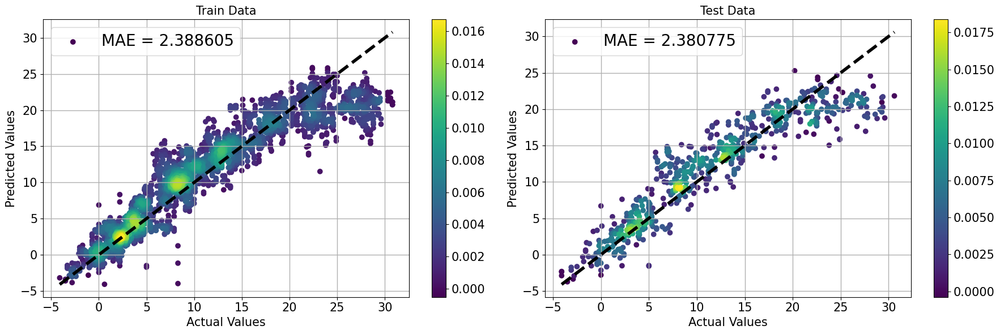

In [48]:
model_name = 'ElasticNet'

score, best_params = hSML.Bayesian_optimization_ElasticNet(X_train, y_train,
                      pbounds={
                            'alpha': (0.1, 10),    # 0 to ~
                            'l1_ratio': (0.1, 1.0) # 0 to 1
                      }, n_iter=20)

with open(f'{save_path}/{model_name}_bayesian_best_params.json','w') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)

model = cuML_ElasticNet(**best_params)
model.fit(X_train, y_train)

# Save the model
joblib.dump(model, f'{save_path}/{model_name}_model.pkl')

relation_square = model.score(X_train, y_train)
print('relation coefficient : ', relation_square)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

### Reconstruct

In [34]:
for year in range(2024, 2024 + 1):
    need_to_recons = pd.read_csv(f'{save_path}/need_to_recons_{year}.csv')

    need_to_recons_geo_indices = make_indices_df(need_to_recons)
    need_to_recons_geo_indices.replace([np.inf, -np.inf], np.nan, inplace=True) # Inf value -> nan

    need_to_recons_geo_indices['tir1'] *= 100
    need_to_recons_geo_indices['tir2'] *= 100
    print(np.shape(need_to_recons_geo_indices[need_to_recons_geo_indices['tir1'] > 100]))
    need_to_recons_geo_indices.loc[need_to_recons_geo_indices['tir1'] > 100, 'tir1'] = np.nan
    need_to_recons_geo_indices.loc[need_to_recons_geo_indices['tir1'] < -100, 'tir1'] = np.nan

    need_to_recons_geo_indices.loc[need_to_recons_geo_indices['tir2'] > 100, 'tir2'] = np.nan
    need_to_recons_geo_indices.loc[need_to_recons_geo_indices['tir2'] < -100, 'tir2'] = np.nan

    need_to_recons_geo_indices = need_to_recons_geo_indices.dropna(axis=0)

    # Predictors of need_to_reconstruct
    predictors_2 = need_to_recons_geo_indices[feature_imp_list].values
    predictors_scaled_2 = scaler_X.fit_transform(predictors_2)


    # Best RF model's param
    with open(f'{save_path}/RF_bayesian_best_params.json', 'r') as file:
        best_params_loaded_RF = json.load(file)
    model_loaded_RF = cuRF(**best_params_loaded_RF)
    model_loaded_RF.fit(predictors_scaled, outcome)
    y_pred_2_RF = model_loaded_RF.predict(predictors_scaled_2)
    y_pred_2_RF_original = scaler_y.inverse_transform(y_pred_2_RF.reshape(-1, 1)).ravel()

    # Best XGB model's param
    with open(f'{save_path}/XGB_bayesian_best_params.json', 'r') as file:
        best_params_loaded_XGB = json.load(file)
    model_loaded_XGB = xgb.XGBRegressor(**best_params_loaded_XGB)
    model_loaded_XGB.fit(predictors_scaled, outcome_scaled)
    y_pred_2_XGB = model_loaded_XGB.predict(predictors_scaled_2)
    y_pred_2_XGB_original = scaler_y.inverse_transform(y_pred_2_XGB.reshape(-1, 1)).ravel()

    # Best SVM model's param
    with open(f'{save_path}/SVM_bayesian_best_params.json', 'r') as file:
        best_params_loaded_SVM = json.load(file)
    model_loaded_SVM = SVR(**best_params_loaded_SVM)
    model_loaded_SVM.fit(predictors_scaled, outcome_scaled)
    y_pred_2_SVM = model_loaded_SVM.predict(predictors_scaled_2)
    y_pred_2_SVM_original = scaler_y.inverse_transform(y_pred_2_SVM.reshape(-1, 1)).ravel()

    # Best LGBM model's param
    with open(f'{save_path}/LGBM_bayesian_best_params.json', 'r') as file:
        best_params_loaded_LGBM = json.load(file)
    model_loaded_LGBM = lgb.LGBMRegressor(**best_params_loaded_LGBM)
    model_loaded_LGBM.fit(predictors_scaled, outcome_scaled)
    y_pred_2_LGBM = model_loaded_LGBM.predict(predictors_scaled_2)
    y_pred_2_LGBM_original = scaler_y.inverse_transform(y_pred_2_LGBM.reshape(-1, 1)).ravel()

    # Reconstruct
    df_recons = pd.DataFrame()
    df_recons['latitude'] = need_to_recons_geo_indices['latitude'].values
    df_recons['longitude'] = need_to_recons_geo_indices['longitude'].values
    df_recons['dates'] = need_to_recons_geo_indices['dates'].values
    df_recons['tir1'] = need_to_recons_geo_indices['tir1'].values
    df_recons['tir2'] = need_to_recons_geo_indices['tir2'].values

    df_recons['RF']   = y_pred_2_RF_original
    df_recons['XGB']  = y_pred_2_XGB_original
    df_recons['SVM']  = y_pred_2_SVM_original
    df_recons['LGBM'] = y_pred_2_LGBM_original

    lat_lon_df = df_recons[['latitude', 'longitude']].copy()
    unique_combinations = lat_lon_df.drop_duplicates()
    unique_combinations_list = list(unique_combinations.itertuples(index=False, name=None))
    
    # =============================================================================
    bound = [126.63, 127.03, 35.04, 35.28] # entire Gwangju
    domain_lon, domain_lat = hGrid.generate_lon_lat_eqdgrid(0.01*0.03, bounds=bound)
    m, n = np.shape(domain_lon)

    # Extract unique latitude, longitude, and date values
    unique_latitudes = np.sort(df_recons['latitude'].unique())
    unique_longitudes = np.sort(df_recons['longitude'].unique())
    unique_dates = np.sort(df_recons['dates'].unique())

    # Create an empty 3D array (latitudes, longitudes, dates), initialized with NaNs
    lat_len = m #len(unique_latitudes)
    lon_len = n #len(unique_longitudes)
    date_len = len(unique_dates)

    # Vectorized approach: map latitude, longitude, and dates to indices
    lat_idx = np.searchsorted(unique_latitudes, df_recons['latitude'].values)
    lon_idx = np.searchsorted(unique_longitudes, df_recons['longitude'].values)
    date_idx = np.searchsorted(unique_dates, df_recons['dates'].values)

    print(np.shape(lat_idx))
    print(lon_idx)
    print(date_idx)

    data_vars = {}
    var_name_list = ['tir1', 'tir2', 'RF', 'XGB', 'SVM', 'LGBM']

    for var_name in var_name_list:
        # Initialize the 3D array with NaNs
        recons_array = np.full((m, n, date_len), np.nan)
        # Now use the indices to place values in the correct spots in the 3D array
        recons_array[lat_idx, lon_idx, date_idx] = df_recons[var_name].values
        data_vars[var_name] = recons_array

    # To avoid permission error (due to already exist file)
    nc_file_path = f'{save_path}/ave_temp_recons_{year}.nc'
    if os.path.exists(nc_file_path):
        os.remove(nc_file_path)
        print(f'File {nc_file_path} has been deleted.')

    domain_lat_ud = np.flipud(domain_lat)
    hData.create_netcdf_file(nc_file=nc_file_path,
                             latitude=domain_lat_ud,
                             longitude=domain_lon,
                             dates=unique_dates,
                             **data_vars)

/tmp/ipykernel_2323752/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2323752/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2323752/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2323752/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2323752/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2323752/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

(19386726, 14)


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning: For reproducible results in Random Forest Classifier or for almost reproducible results in Random Forest Regressor, n_streams=1 is recommended. If n_streams is > 1, results may vary due to stream/thread timing differences, even when random_state is set
  return func(**kwargs)


(363607,)
[ 397  397  626 ... 1097 1098 1330]
[ 0  0  0 ... 49 49 49]
File /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2013_2024/ave_temp_recons_2024.nc has been deleted.
NetCDF file /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2013_2024/ave_temp_recons_2024.nc created successfully.


[20230107 20230108 20230116 20230123 20230131 20230201 20230208 20230209
 20230217 20230224 20230225 20230304 20230305 20230313 20230320 20230321
 20230328 20230329 20230413 20230414 20230421 20230422 20230430 20230508
 20230515 20230516 20230523 20230531 20230601 20230608 20230609 20230616
 20230617 20230624 20230625 20230702 20230703 20230710 20230711 20230718
 20230719 20230726 20230727 20230803 20230804 20230811 20230812 20230819
 20230820 20230827 20230904 20230905 20230912 20230928 20230929 20231006
 20231007 20231014 20231015 20231022 20231023 20231030 20231031 20231107
 20231108 20231115 20231123 20231124 20231201 20231202 20231209 20231210
 20231217 20231218 20231225 20231226]
(800, 1333, 76)
True y -4.1 30.8


/tmp/ipykernel_2323752/2720101428.py:6: RuntimeWarning: Mean of empty slice
  target = np.nanmean(data_vars[var_name], axis=2)


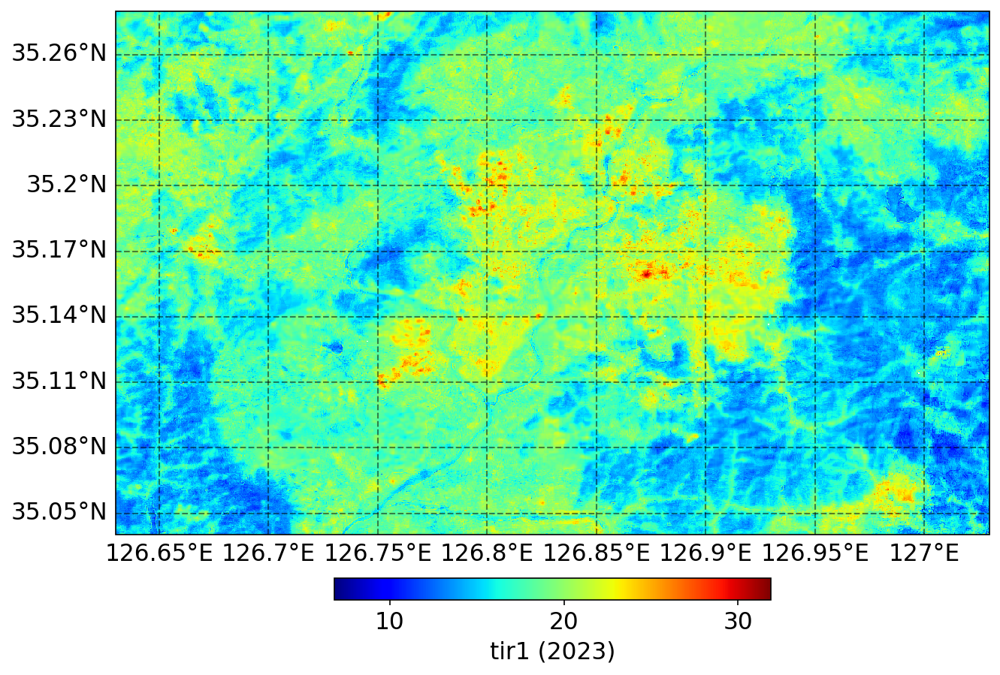

tir1 0.0 46.603334000000004


/tmp/ipykernel_2323752/2720101428.py:6: RuntimeWarning: Mean of empty slice
  target = np.nanmean(data_vars[var_name], axis=2)


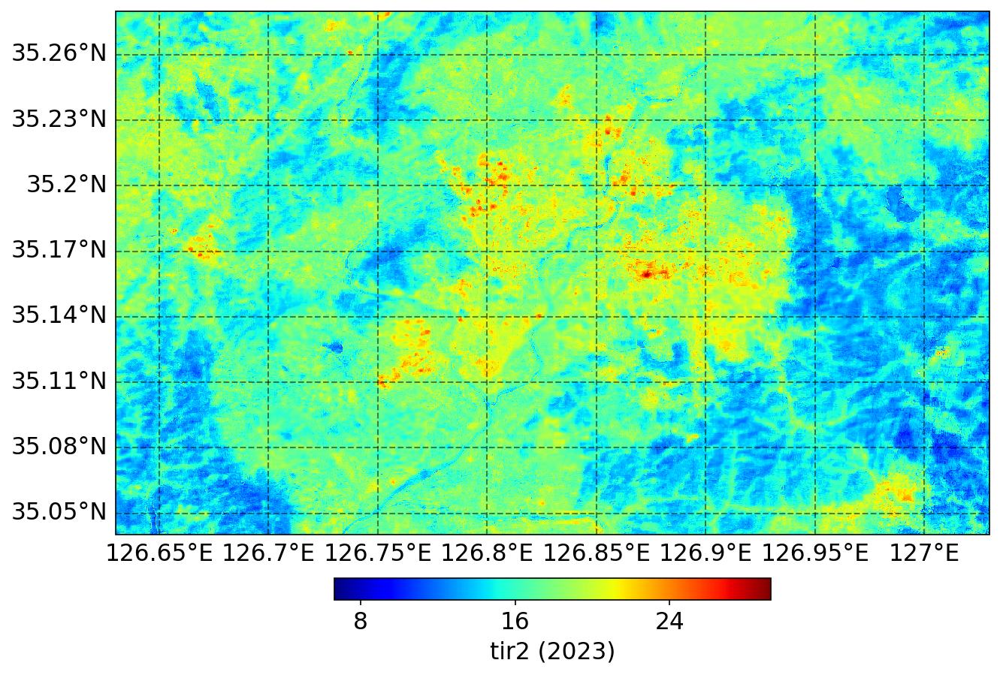

tir2 0.0 43.0


/tmp/ipykernel_2323752/2720101428.py:6: RuntimeWarning: Mean of empty slice
  target = np.nanmean(data_vars[var_name], axis=2)


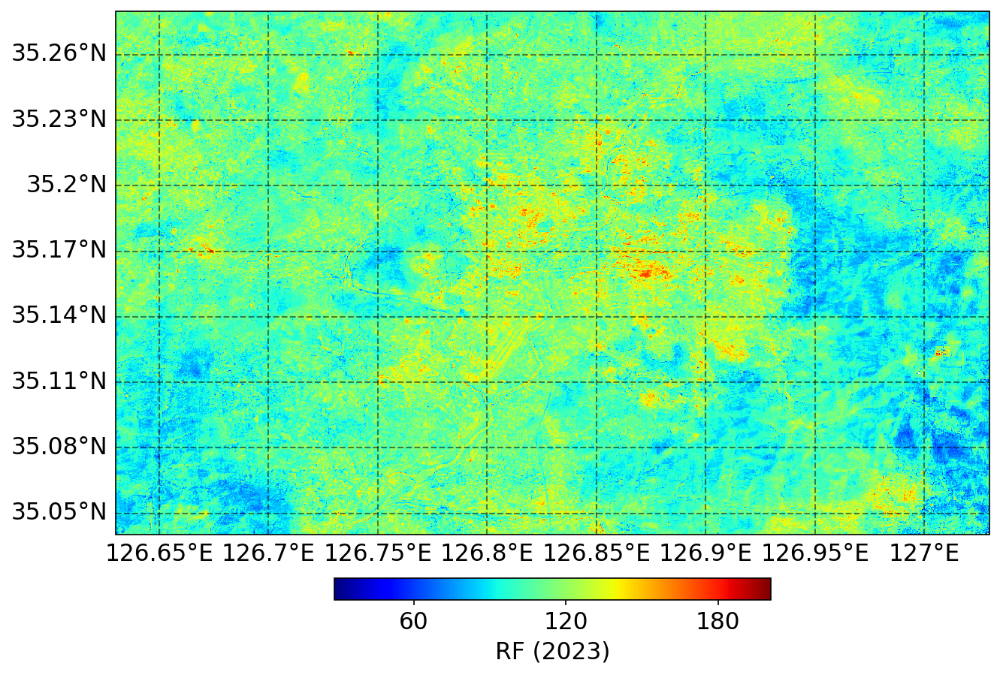

RF -22.217834279938884 254.59447305685404


/tmp/ipykernel_2323752/2720101428.py:6: RuntimeWarning: Mean of empty slice
  target = np.nanmean(data_vars[var_name], axis=2)


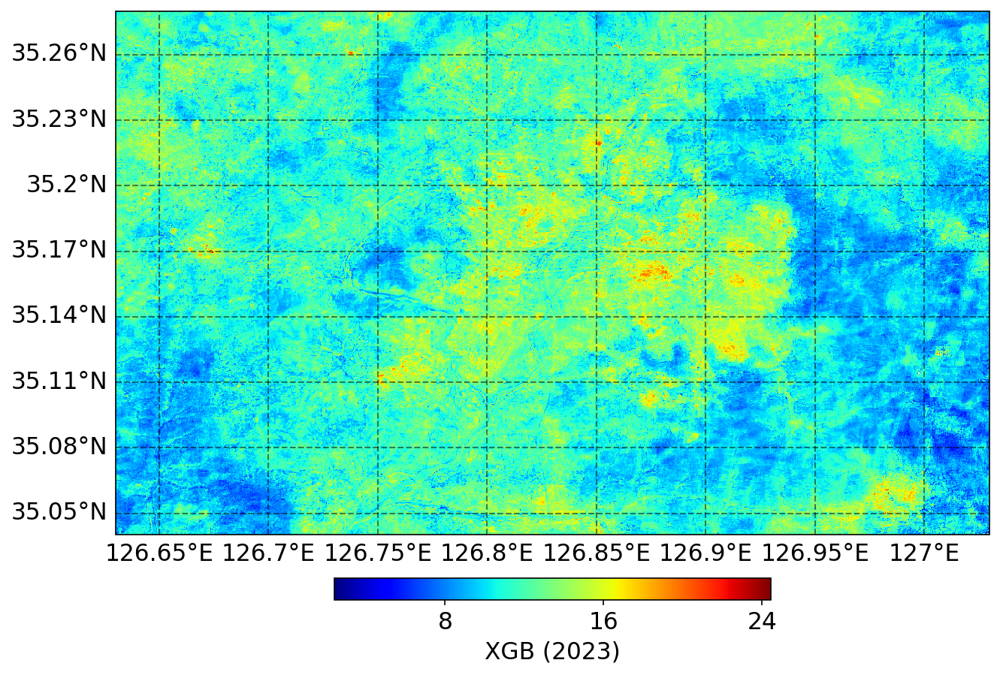

XGB -4.800666809082031 31.722442626953125


/tmp/ipykernel_2323752/2720101428.py:6: RuntimeWarning: Mean of empty slice
  target = np.nanmean(data_vars[var_name], axis=2)


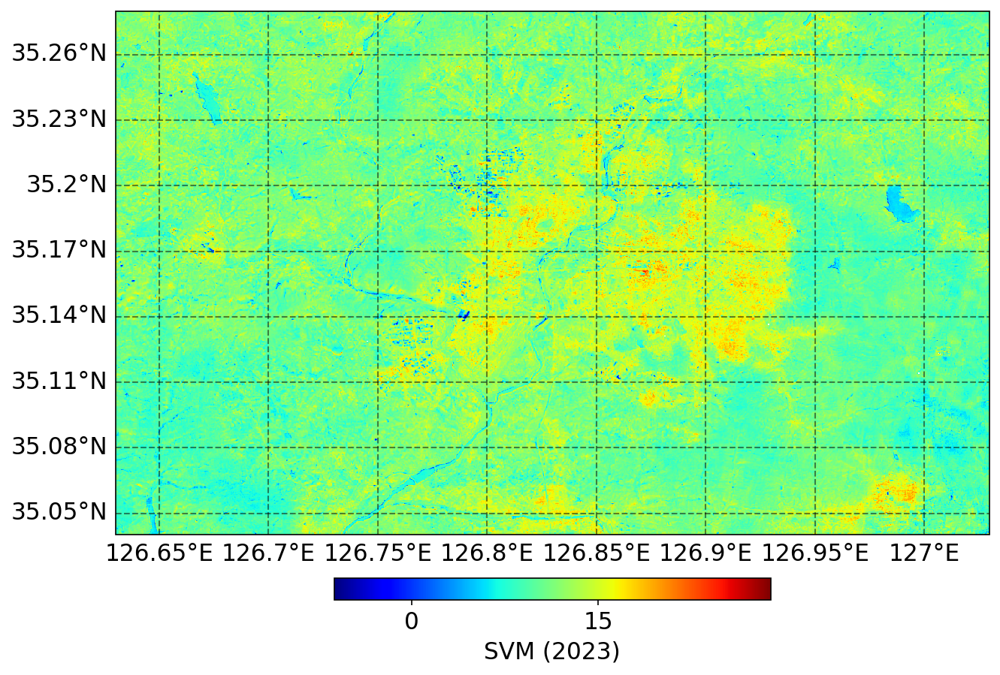

SVM -27.192758296757177 81.51660488582216


/tmp/ipykernel_2323752/2720101428.py:6: RuntimeWarning: Mean of empty slice
  target = np.nanmean(data_vars[var_name], axis=2)


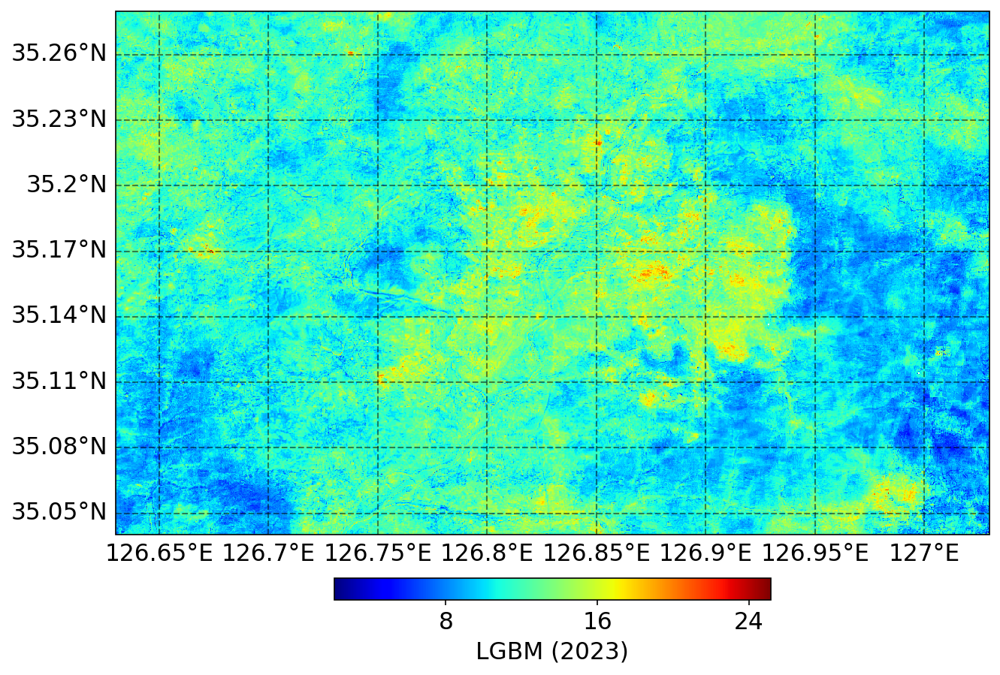

LGBM -4.087364988440013 30.809400148864853


In [31]:
print(unique_dates)
print(np.shape(data_vars[var_name]))
print('True y', np.nanmin(outcome), np.nanmax(outcome))

for var_name in var_name_list:
    target = np.nanmean(data_vars[var_name], axis=2)
    hPlot.plot_map(domain_lon, domain_lat_ud, target, np.nanmin(target), np.nanmax(target), label_title=f'{var_name} ({year})', projection='PlateCarree')
    print(var_name, np.nanmin(data_vars[var_name]), np.nanmax(data_vars[var_name]))